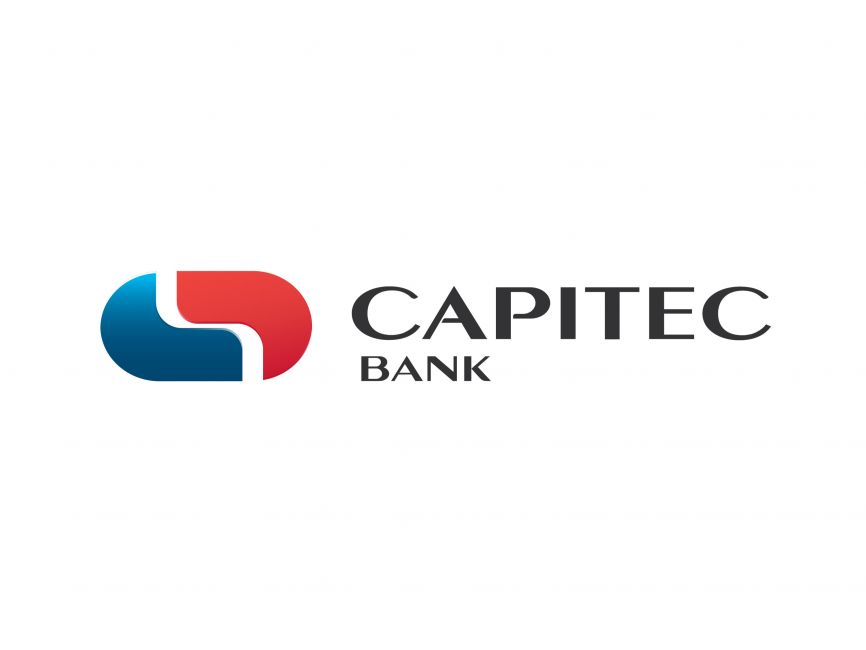

## ***Load Libraries***

In [18]:
%pip install lime

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [19]:
%pip install shap

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [20]:
%pip install torch

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [21]:
%pip install tensorflow

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [22]:
import tensorflow as tf
tf.config.set_visible_devices([], 'GPU')

In [23]:
%pip install transformers

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [24]:
%pip install torch

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [25]:
%pip install wordcloud

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [26]:
#!pip uninstall keras
#!pip install keras==2.11

In [27]:
%pip install tf-keras

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [28]:
%pip install lime

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [29]:
%pip install keras-tuner

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [30]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
import re
nltk.download('punkt_tab')
import pandas as pd
import numpy as np
import string
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from transformers import BertTokenizer, BertModel
import torch
from sklearn.decomposition import LatentDirichletAllocation, PCA
from sklearn.feature_extraction.text import CountVectorizer
import os
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import seaborn as sns
from tqdm.notebook import tqdm
from tensorflow.keras.models import load_model
from lime.lime_text import LimeTextExplainer
from transformers import BertTokenizer, TFBertModel
import tensorflow as tf
from collections import Counter
import plotly.express as px
from plotly import colors
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from sklearn.utils import class_weight
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, GRU, SimpleRNN, Dense, Dropout
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping
import keras_tuner as kt
from tensorflow.keras.layers import GRU, Dropout, Dense
import pickle

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\PLubi\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\PLubi\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\PLubi\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\PLubi\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


## ***Load Dataset***

In [31]:
# Folder path
folder_path = r'C:\Users\PLubi\OneDrive - Sol Plaatje University\Desktop\Capitec bank\Data'

In [32]:
# -----------------------------
# .Capitec
# -----------------------------
df = pd.read_csv(os.path.join(folder_path, 'capitec_bank_reviews.csv'), parse_dates=['at', 'repliedAt'])
print(" Capitec bank loaded:", df.shape)

 Capitec bank loaded: (56035, 11)


In [33]:
df.head()

,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt,appVersion
0,e2fb8b1f-b40e-4d44-bf8b-782fdf5c917c,Nelisiwe Mthimunye,https://play-lh.googleusercontent.com/a/ACg8oc...,Love the app user friendly,5,0,NaN,2024-12-31 21:00:14,Hello Nelisiwe. We're delighted to hear that y...,2025-01-27 10:58:13,NaN
1,7693935b-642f-4a18-87bd-4eba62f5b00f,Naledi Picoyagae,https://play-lh.googleusercontent.com/a/ACg8oc...,I want to open my Capitec Bank Accout but it w...,5,1,3.4.3,2024-12-31 20:56:56,Hello Naledi. We’re thrilled to receive your 5...,2025-01-27 10:54:49,3.4.3
2,8bdba460-bbc9-41d6-9466-fbc774bc716f,Mduh Gumede,https://play-lh.googleusercontent.com/a/ACg8oc...,Capitec app makes thing becaming more easier.,4,0,3.2.0,2024-12-31 20:54:51,"Hi Mduh, thanks for the awesome review! We wor...",2025-01-01 07:37:39,3.2.0
3,ef86eade-3001-4e54-8c65-6d6eea241743,salebona hadebe,https://play-lh.googleusercontent.com/a/ACg8oc...,Perfect,5,0,3.4.2,2024-12-31 19:41:11,"Hi Salebona, thank you for the app review. A h...",2025-01-01 07:29:54,3.4.2
4,a2e82c8f-0a33-46cf-910a-60d41a35afb7,Nomakholen Mawandla,https://play-lh.googleusercontent.com/a-/ALV-U...,Kholiwe selina leputla,5,0,NaN,2024-12-31 18:21:39,"Hello Nomakholen. Wow, we love the 5-star rati...",2025-01-27 10:44:08,NaN


# ***EDA***

In [34]:
# Display summary information about the dataset
print("\nSummary information about the dataset:")
print(df.info())


Summary information about the dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56035 entries, 0 to 56034
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   reviewId              56035 non-null  object        
 1   userName              56035 non-null  object        
 2   userImage             56035 non-null  object        
 3   content               56014 non-null  object        
 4   score                 56035 non-null  int64         
 5   thumbsUpCount         56035 non-null  int64         
 6   reviewCreatedVersion  43299 non-null  object        
 7   at                    56035 non-null  datetime64[ns]
 8   replyContent          48438 non-null  object        
 9   repliedAt             48438 non-null  datetime64[ns]
 10  appVersion            43299 non-null  object        
dtypes: datetime64[ns](2), int64(2), object(7)
memory usage: 4.7+ MB
None


In [35]:
# statistics for numerical columns
print("\nBasic statistics for numerical columns:")
df.describe()


Basic statistics for numerical columns:


,score,thumbsUpCount,at,repliedAt
count,56035.000000,56035.000000,56035,48438
mean,3.458178,3.211618,2022-06-12 22:26:38.709663744,2022-06-20 05:33:38.103018240
min,1.000000,0.000000,2019-10-21 08:45:11,2019-10-21 12:22:30
25%,1.000000,0.000000,2021-04-14 04:43:59.500000,2021-04-23 09:32:41.249999872
50%,5.000000,0.000000,2022-02-06 11:35:34,2022-01-15 16:26:28
75%,5.000000,0.000000,2023-10-25 13:39:55,2023-11-17 13:51:59
max,5.000000,4393.000000,2024-12-31 21:00:14,2025-01-27 10:58:13
std,1.797364,59.042260,NaN,NaN


In [36]:
# Check for missing values
print("\nMissing values in each column:")
df.isnull().sum()


Missing values in each column:


reviewId                    0
userName                    0
userImage                   0
content                    21
score                       0
thumbsUpCount               0
reviewCreatedVersion    12736
at                          0
replyContent             7597
repliedAt                7597
appVersion              12736
dtype: int64

In [37]:
# Display the distribution of scores
print("\nDistribution of scores:")
df['score'].value_counts()


Distribution of scores:


score
5    29353
1    17157
4     4012
3     2783
2     2730
Name: count, dtype: int64

In [38]:
# Display the distribution of thumbs up count
print("\nDistribution of thumbs up count:")
df['thumbsUpCount'].value_counts()


Distribution of thumbs up count:


thumbsUpCount
0       46815
1        4546
2        1405
3         691
4         417
        ...  
241         1
175         1
2643        1
459         1
220         1
Name: count, Length: 312, dtype: int64

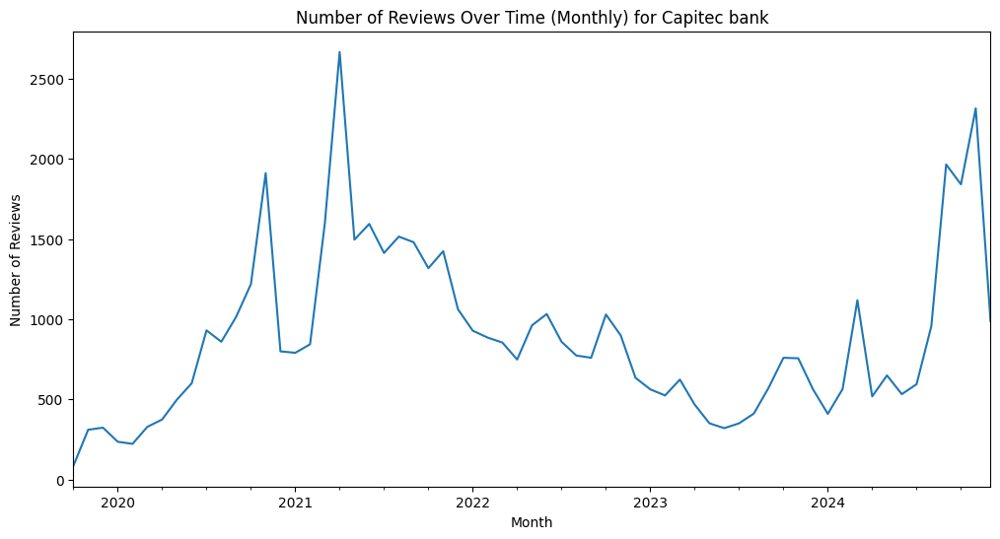

In [39]:
# Overall reviews over time
df['at'].dt.to_period('M').value_counts().sort_index().plot(kind='line', figsize=(12, 6))
plt.title('Number of Reviews Over Time (Monthly) for Capitec bank')
plt.xlabel('Month')
plt.ylabel('Number of Reviews')
plt.show()

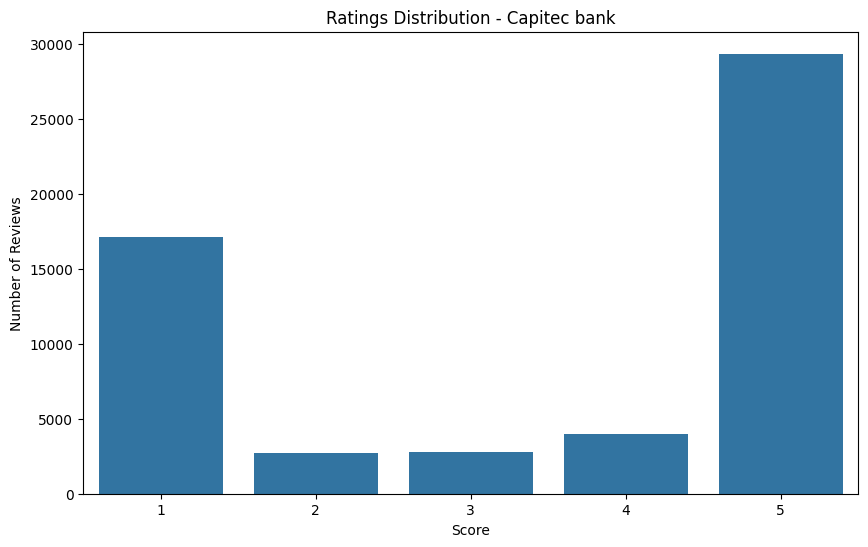

In [40]:
# Count reviews per score
counts = (
    df.groupby('score')
    .size()
    .reset_index(name='count')
)

# Sort and plot
counts = counts.sort_values('score')

plt.figure(figsize=(10, 6))
sns.barplot(
    data=counts,
    x='score',
    y='count',
    order=[1, 2, 3, 4, 5]
)

plt.title('Ratings Distribution - Capitec bank')
plt.xlabel('Score')
plt.ylabel('Number of Reviews')
plt.show()

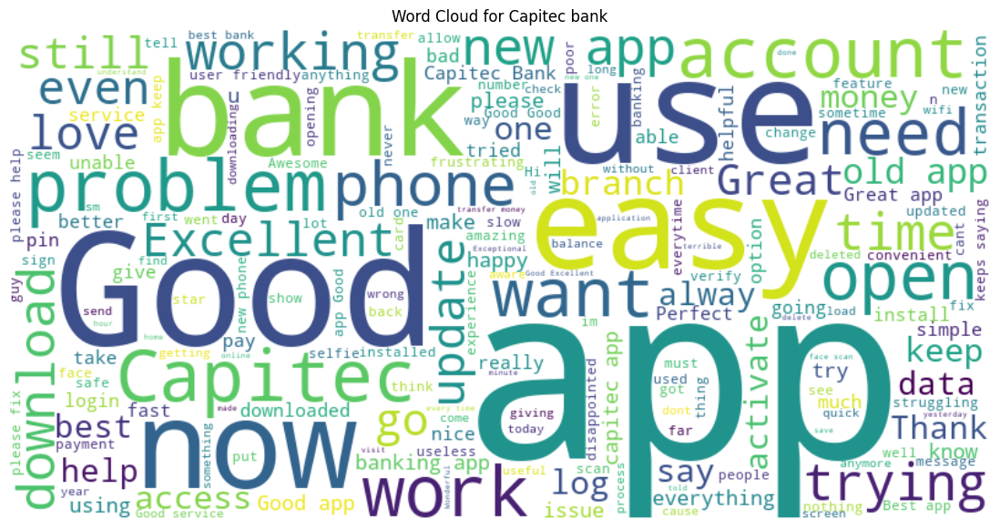

In [41]:
# Overall Word Cloud
all_text = " ".join(df['content'].dropna().astype(str))

wordcloud_all = WordCloud(width=800, height=400, background_color='white').generate(all_text)

plt.figure(figsize=(15, 7))
plt.imshow(wordcloud_all, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Capitec bank')
plt.show()

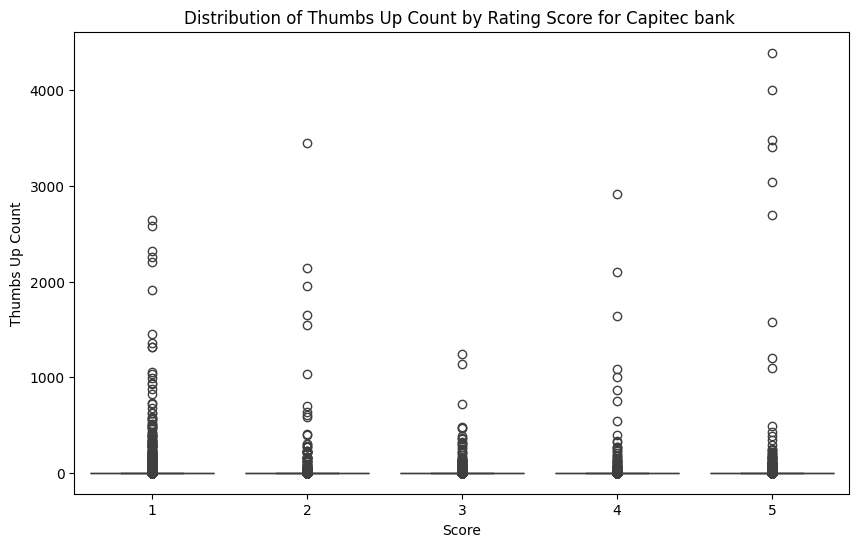

In [42]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='score', y='thumbsUpCount')
plt.title('Distribution of Thumbs Up Count by Rating Score for Capitec bank ')
plt.xlabel('Score')
plt.ylabel('Thumbs Up Count')
plt.show()

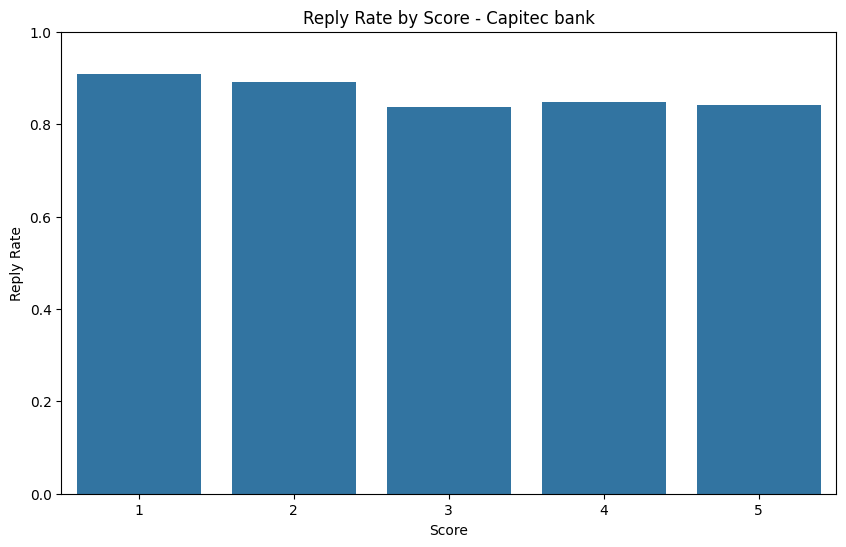

In [43]:
# Add reply flag
df['has_reply'] = df['replyContent'].notnull()

# Group by score only (no Bank_Name)
reply_rate_by_score = (
    df.groupby('score')['has_reply']
    .mean()
    .reset_index()
)

#  Sort by score
reply_rate_by_score = reply_rate_by_score.sort_values('score')

#  Plot: simple bar plot, no hue needed
plt.figure(figsize=(10, 6))
sns.barplot(
    data=reply_rate_by_score,
    x='score',
    y='has_reply',
    order=[1, 2, 3, 4, 5]
)

# Labels & title
plt.xlabel("Score")
plt.ylabel("Reply Rate")
plt.title("Reply Rate by Score - Capitec bank")
plt.ylim(0, 1)
plt.show()


# ***Data Cleaning and Preprocessing***

In [44]:
# Drop rows where review text is missing
df = df.dropna(subset=['content']).reset_index(drop=True)

In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56014 entries, 0 to 56013
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   reviewId              56014 non-null  object        
 1   userName              56014 non-null  object        
 2   userImage             56014 non-null  object        
 3   content               56014 non-null  object        
 4   score                 56014 non-null  int64         
 5   thumbsUpCount         56014 non-null  int64         
 6   reviewCreatedVersion  43286 non-null  object        
 7   at                    56014 non-null  datetime64[ns]
 8   replyContent          48424 non-null  object        
 9   repliedAt             48424 non-null  datetime64[ns]
 10  appVersion            43286 non-null  object        
 11  has_reply             56014 non-null  bool          
dtypes: bool(1), datetime64[ns](2), int64(2), object(7)
memory usage: 4.8+ MB


In [46]:
# ================================================
#  STEP 2: Keep useful columns
# ================================================
# Example: using your combined_df
columns_to_keep = ['content', 'score', 'at','thumbsUpCount', 'appVersion']
df = df[columns_to_keep].copy()


In [47]:
# Fill missing appVersion with 'unknown'
df['appVersion'] = df['appVersion'].fillna('unknown')

In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56014 entries, 0 to 56013
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   content        56014 non-null  object        
 1   score          56014 non-null  int64         
 2   at             56014 non-null  datetime64[ns]
 3   thumbsUpCount  56014 non-null  int64         
 4   appVersion     56014 non-null  object        
dtypes: datetime64[ns](1), int64(2), object(2)
memory usage: 2.1+ MB


## **FEATURE ENGINEERING**

In [49]:
def label_sentiment(score):
    if score <= 2:
        return 'negative'
    elif score == 3:
        return 'neutral'
    else:
        return 'positive'

# Apply the function to create a new 'sentiment' column
df['sentiment'] = df['score'].apply(label_sentiment)

# Print the value counts of the 'sentiment' column
print(df['sentiment'].value_counts())


sentiment
positive    33350
negative    19883
neutral      2781
Name: count, dtype: int64


In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56014 entries, 0 to 56013
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   content        56014 non-null  object        
 1   score          56014 non-null  int64         
 2   at             56014 non-null  datetime64[ns]
 3   thumbsUpCount  56014 non-null  int64         
 4   appVersion     56014 non-null  object        
 5   sentiment      56014 non-null  object        
dtypes: datetime64[ns](1), int64(2), object(3)
memory usage: 2.6+ MB


In [51]:
df.head()

,content,score,at,thumbsUpCount,appVersion,sentiment
0,Love the app user friendly,5,2024-12-31 21:00:14,0,unknown,positive
1,I want to open my Capitec Bank Accout but it w...,5,2024-12-31 20:56:56,1,3.4.3,positive
2,Capitec app makes thing becaming more easier.,4,2024-12-31 20:54:51,0,3.2.0,positive
3,Perfect,5,2024-12-31 19:41:11,0,3.4.2,positive
4,Kholiwe selina leputla,5,2024-12-31 18:21:39,0,unknown,positive


In [52]:
temp = df.groupby('sentiment').count()['content'].reset_index().sort_values(by='content',ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment,content
2,positive,33350
0,negative,19883
1,neutral,2781


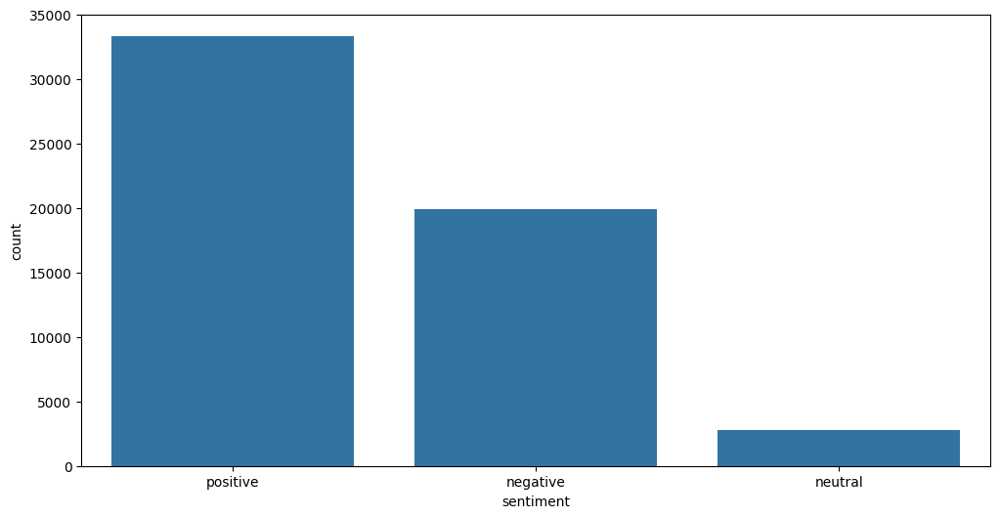

In [53]:
plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df)
plt.show()

In [54]:
# =========================
import re
import numpy as np
import pandas as pd
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import contractions
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA

# =========================
#  TEXT CLEANING FUNCTION
# =========================
stop_words = set(stopwords.words('english')) - {'no', 'not'}
lemmatizer = WordNetLemmatizer()

def clean_text(text):
    # Expand contractions
    text = contractions.fix(text)
    text = text.lower()
    
    # Remove URLs
    text = re.sub(r'http\S+|www\S+|https\S+', '', text)
    
    # Remove non-letters (keep alphabet and space)
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    
    # Remove extra whitespace
    text = re.sub(r'\s+', ' ', text).strip()
    
    # Tokenize
    tokens = word_tokenize(text)
    
    # Remove stopwords (preserving negations) + lemmatize
    tokens = [lemmatizer.lemmatize(w) for w in tokens if w not in stop_words]
    
    return ' '.join(tokens)

df['clean_content'] = df['content'].apply(clean_text)



In [55]:
df.head()

,content,score,at,thumbsUpCount,appVersion,sentiment,clean_content
0,Love the app user friendly,5,2024-12-31 21:00:14,0,unknown,positive,love app user friendly
1,I want to open my Capitec Bank Accout but it w...,5,2024-12-31 20:56:56,1,3.4.3,positive,want open capitec bank accout want branch
2,Capitec app makes thing becaming more easier.,4,2024-12-31 20:54:51,0,3.2.0,positive,capitec app make thing becaming easier
3,Perfect,5,2024-12-31 19:41:11,0,3.4.2,positive,perfect
4,Kholiwe selina leputla,5,2024-12-31 18:21:39,0,unknown,positive,kholiwe selina leputla


# **Insightful Visualization**

In [56]:
df['temp_list'] = df['clean_content'].apply(lambda x:str(x).split())
top = Counter([item for sublist in df['temp_list'] for item in sublist])
temp = pd.DataFrame(top.most_common(20))
temp.columns = ['Common_words','count']
temp.style.background_gradient(cmap='Blues')

,Common_words,count
0,app,28423
1,not,20860
2,good,9059
3,capitec,5067
4,bank,4998
5,use,4309
6,new,3740
7,easy,3519
8,time,3476
9,work,3093


In [57]:
fig = px.bar(temp, x="count", y="Common_words", title='Commmon Words in Selected Text', orientation='h',
             width=700, height=700,color='Common_words')
fig.show()

In [58]:
def remove_stopword(x):
    return [y for y in x if y not in stopwords.words('english')]
df['temp_list'] = df['temp_list'].apply(lambda x:remove_stopword(x))

In [59]:
top = Counter([item for sublist in df['temp_list'] for item in sublist])
temp = pd.DataFrame(top.most_common(20))
temp = temp.iloc[1:,:]
temp.columns = ['Common_words','count']
temp.style.background_gradient(cmap='Purples')

,Common_words,count
1,good,9059
2,capitec,5067
3,bank,4998
4,use,4309
5,new,3740
6,easy,3519
7,time,3476
8,work,3093
9,account,2990
10,keep,2782


## **Most Common words in Text**

In [60]:
df['temp_list1'] = df['content'].apply(lambda x:str(x).split())
df['temp_list1'] = df['temp_list1'].apply(lambda x:remove_stopword(x))

In [61]:
top = Counter([item for sublist in df['temp_list1'] for item in sublist])
temp = pd.DataFrame(top.most_common(25))
temp = temp.iloc[1:,:]
temp.columns = ['Common_words','count']
temp.style.background_gradient(cmap='Blues')

,Common_words,count
1,app,21886
2,Good,4742
3,good,3969
4,use,3806
5,can't,3722
6,new,3522
7,The,3443
8,bank,3425
9,This,3391
10,It,3294


In [62]:
fig = px.bar(temp, x="count", y="Common_words", title='Commmon Words in Text', orientation='h',
             width=700, height=700,color='Common_words')
fig.show()

## **Most common words Sentiments Wise**

In [63]:
Positive_sent = df[df['sentiment']=='positive']
Negative_sent = df[df['sentiment']=='negative']
Neutral_sent = df[df['sentiment']=='neutral']

### Most common positive words

In [64]:
#MosT common positive words
top = Counter([item for sublist in Positive_sent['temp_list'] for item in sublist])
temp_positive = pd.DataFrame(top.most_common(20))
temp_positive.columns = ['Common_words','count']
temp_positive.style.background_gradient(cmap='Greens')

,Common_words,count
0,app,9295
1,good,7810
2,easy,3191
3,excellent,2684
4,bank,2605
5,use,2464
6,capitec,2388
7,great,2338
8,best,2295
9,love,1762


In [65]:
fig = px.bar(temp_positive, x="count", y="Common_words", title='Most Commmon Positive Words', orientation='h',
             width=700, height=700,color='Common_words')
fig.show()

### Most common Negative words

In [66]:
#MosT common negative words
top = Counter([item for sublist in Negative_sent['temp_list'] for item in sublist])
temp_negative = pd.DataFrame(top.most_common(20))
temp_negative = temp_negative.iloc[1:,:]
temp_negative.columns = ['Common_words','count']
temp_negative.style.background_gradient(cmap='Reds')

,Common_words,count
1,new,2822
2,time,2504
3,capitec,2439
4,keep,2262
5,bank,2166
6,even,2134
7,account,2117
8,work,2072
9,phone,2063
10,old,2029


In [67]:
fig = px.bar(temp_negative, x="count", y="Common_words", title='Most Commmon negative Words', orientation='h',
             width=700, height=700,color='Common_words')
fig.show()

### Most common Neutral words

In [68]:
#MosT common Neutral words
top = Counter([item for sublist in Neutral_sent['temp_list'] for item in sublist])
temp_neutral = pd.DataFrame(top.most_common(20))
temp_neutral = temp_neutral.loc[1:,:]
temp_neutral.columns = ['Common_words','count']
temp_neutral.style.background_gradient(cmap='Reds')

,Common_words,count
1,good,462
2,new,259
3,please,243
4,capitec,240
5,bank,227
6,phone,225
7,use,218
8,account,217
9,time,216
10,problem,215


In [69]:
fig = px.bar(temp_neutral, x="count", y="Common_words", title='Most Commmon Neutral Words', orientation='h',
             width=700, height=700,color='Common_words')
fig.show()

## **Wordcloud**

In [70]:
def plot_wordcloud(text, mask=None, max_words=200, max_font_size=100, figure_size=(24.0,16.0), color = 'white',
                   title = None, title_size=40, image_color=False):
    stopwords = set(STOPWORDS)
    more_stopwords = {'u', "im"}
    stopwords = stopwords.union(more_stopwords)

    wordcloud = WordCloud(background_color=color,
                    stopwords = stopwords,
                    max_words = max_words,
                    max_font_size = max_font_size,
                    random_state = 42,
                    width=400,
                    height=200,
                    mask = mask)
    wordcloud.generate(str(text))

    plt.figure(figsize=figure_size)
    if image_color:
        image_colors = ImageColorGenerator(mask);
        plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation="bilinear");
        plt.title(title, fontdict={'size': title_size,
                                  'verticalalignment': 'bottom'})
    else:
        plt.imshow(wordcloud);
        plt.title(title, fontdict={'size': title_size, 'color': 'black',
                                  'verticalalignment': 'bottom'})
    plt.axis('off');
    plt.tight_layout()
d = '/kaggle/input/masks-for-wordclouds/'

In [71]:
cyberpunk_palette = ["#FF00FF", "#00FF00", "#0000FF"]
template = "plotly_dark"

In [72]:
# Word Length Distribution
word_lengths = [len(word) for text in df['content'] for word in text.split()]
word_lengths_counts = {length: word_lengths.count(length) for length in set(word_lengths)}

# Sort the word lengths by count in descending order
sorted_word_lengths = sorted(word_lengths_counts.items(), key=lambda x: x[1], reverse=True)
# Create a custom colorscale with a fixed number of colors
colorscale = colors.sample_colorscale('Viridis', len(word_lengths_counts))

In [73]:
# Create the bar chart trace
bar_trace = go.Bar(
    x=[length for length, count in sorted_word_lengths],
    y=[count for length, count in sorted_word_lengths],
    marker=dict(
        color=[colorscale[i] for i in range(len(sorted_word_lengths))],
        line=dict(
            color=cyberpunk_palette[0],
            width=2
        )
    ),
    hovertemplate='Word Length: %{x}<br>Count: %{y}<extra></extra>'
)

In [74]:
# Create the neon light effect trace
light_effect_trace = go.Scatter(
    x=[length for length, count in sorted_word_lengths],
    y=[count * 1.05 for length, count in sorted_word_lengths],
    mode='lines',
    line=dict(
        color=cyberpunk_palette[1],
        width=5
    ),
    hoverinfo='skip'
)

In [75]:
# Create the layout
layout = go.Layout(
    title="Word Length Distribution",
    xaxis=dict(
        title="Word Length",
        tickfont=dict(color=cyberpunk_palette[2])
    ),
    yaxis=dict(
        title="Count",
        tickfont=dict(color=cyberpunk_palette[2])
    ),
    plot_bgcolor="black",
    paper_bgcolor="black",
    font_color=cyberpunk_palette[2],
    title_font_color=cyberpunk_palette[2],
    title_font_size=20,
    margin=dict(t=80, l=100, r=50, b=100)
)

# Create the figure and show it
fig = go.Figure(data=[bar_trace, light_effect_trace], layout=layout)
fig.show()

In [76]:
# Sentence Length Distribution
sentence_lengths = [len(text.split()) for text in df['content']]

# Create a custom colorscale with a fixed number of colors
colorscale = colors.sample_colorscale('Viridis', len(set(sentence_lengths)))

bar_trace = go.Bar(
    x=sorted(set(sentence_lengths)),
    y=[sentence_lengths.count(length) for length in sorted(set(sentence_lengths))],
    marker=dict(
        color=[colorscale[i] for i in range(len(set(sentence_lengths)))],
        line=dict(
            color=cyberpunk_palette[0],
            width=2
        )
    ),
    hovertemplate='Sentence Length: %{x}<br>Count: %{y}<extra></extra>'
)

In [77]:
light_effect_trace = go.Scatter(
    x=sorted(set(sentence_lengths)),
    y=[sentence_lengths.count(length) * 1.05 for length in sorted(set(sentence_lengths))],
    mode='lines',
    line=dict(
        color=cyberpunk_palette[1],
        width=5
    ),
    hoverinfo='skip'
)

In [78]:
layout = go.Layout(
    title="Sentence Length Distribution",
    xaxis=dict(
        title="Sentence Length",
        tickfont=dict(color=cyberpunk_palette[2])
    ),
    yaxis=dict(
        title="Count",
        tickfont=dict(color=cyberpunk_palette[2])
    ),
    plot_bgcolor="black",
    paper_bgcolor="black",
    font_color=cyberpunk_palette[2],
    title_font_color=cyberpunk_palette[2],
    title_font_size=20,
    margin=dict(t=80, l=100, r=50, b=100)
)
fig = go.Figure(data=[bar_trace, light_effect_trace], layout=layout)
fig.show()

### Word cloud for positive Sentiment

In [79]:
# Word Cloud for Positive Sentiment
positive_text = ' '.join(df[df['sentiment'] == 'positive']['content'])
wordcloud = WordCloud(background_color='black', width = 800, height = 400, max_words=200, colormap='Greens').generate(positive_text)
fig = go.Figure(go.Image(z = np.dstack((wordcloud.to_array(), wordcloud.to_array(), wordcloud.to_array()))))
fig.update_layout(
    title = 'Word Cloud For Positive Sentiment',
    template = template,
    plot_bgcolor = 'black',
    paper_bgcolor = 'black',
    font_color = cyberpunk_palette[2],
    title_font_color = cyberpunk_palette[2],
    title_font_size = 20,
    margin = dict(t = 80, l = 50, r = 50, b = 50)
)
fig.show()

### word cloud for Negative Sentiment

In [80]:
# Word Cloud for Negative Sentiment
negative_text = ' '.join(df[df['sentiment'] == 'negative']['content'])
wordcloud = WordCloud(background_color='black', width=800, height=400, max_words=200, colormap='Reds').generate(negative_text)
fig = go.Figure(go.Image(z=np.dstack((wordcloud.to_array(), wordcloud.to_array(), wordcloud.to_array()))))
fig.update_layout(
    title="Word Cloud for Negative Sentiment",
    template=template,
    plot_bgcolor="black",
    paper_bgcolor="black",
    font_color=cyberpunk_palette[2],
    title_font_color=cyberpunk_palette[2],
    title_font_size=20,
    margin=dict(t=80, l=50, r=50, b=50)
)
fig.show()

### word cloud for Neutral Sentiment

In [81]:
# Word Cloud for Neutral Sentiment
neutral_text = ' '.join(df[df['sentiment'] == 'neutral']['content'])
wordcloud = WordCloud(background_color='black', width=800, height=400, max_words=200, colormap='Blues').generate(neutral_text)
fig = go.Figure(go.Image(z=np.dstack((wordcloud.to_array(), wordcloud.to_array(), wordcloud.to_array()))))
fig.update_layout(
    title="Word Cloud for Neutral Sentiment",
    template=template,
    plot_bgcolor="black",
    paper_bgcolor="black",
    font_color=cyberpunk_palette[2],
    title_font_color=cyberpunk_palette[2],
    title_font_size=20,
    margin=dict(t=80, l=50, r=50, b=50)
)
fig.show()

# ***MODELS BUILDING***

## **BERT EMBEDDING**

In [85]:
from transformers import BertTokenizer, BertModel
import torch
import numpy as np
import pandas as pd
from tqdm import tqdm

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
bert_model = BertModel.from_pretrained('bert-base-uncased')

batch_size = 32
embeddings = []

bert_model.eval()  # disable dropout

for i in tqdm(range(0, len(df), batch_size), desc="Generating embeddings"):
    batch_texts = df['clean_content'].iloc[i:i+batch_size].tolist()
    inputs = tokenizer(batch_texts, return_tensors='pt', padding=True, truncation=True, max_length=128)
    with torch.no_grad():
        outputs = bert_model(**inputs)
    pooled = outputs.last_hidden_state.mean(dim=1).numpy()
    embeddings.extend(pooled)

df['embedding'] = list(embeddings)


Generating embeddings: 100%|██████████| 1751/1751 [30:23<00:00,  1.04s/it]


In [88]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56014 entries, 0 to 56013
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   content        56014 non-null  object        
 1   score          56014 non-null  int64         
 2   at             56014 non-null  datetime64[ns]
 3   thumbsUpCount  56014 non-null  int64         
 4   appVersion     56014 non-null  object        
 5   sentiment      56014 non-null  object        
 6   clean_content  56014 non-null  object        
 7   temp_list      56014 non-null  object        
 8   temp_list1     56014 non-null  object        
 9   embedding      56014 non-null  object        
dtypes: datetime64[ns](1), int64(2), object(7)
memory usage: 4.3+ MB


In [89]:
df['day'] = df['at'].dt.date

In [90]:
# =========================
# 2️⃣ Daily Aggregations
# =========================
daily_embeddings = df.groupby('day')['embedding'].apply(lambda emb: np.mean(np.stack(emb), axis=0)).reset_index()
daily_scores = df.groupby('day')['score'].mean().reset_index()
failures_per_day = df[df['score'] < 3].groupby('day').size().reset_index(name='failures_count')
total_per_day = df.groupby('day').size().reset_index(name='total_count')

daily_data = (
    daily_embeddings
    .merge(daily_scores, on='day')
    .merge(failures_per_day, on='day', how='left')
    .merge(total_per_day, on='day', how='left')
)
daily_data['failures_count'] = daily_data['failures_count'].fillna(0).astype(int)
daily_data['failure'] = (daily_data['score'] < 3).astype(int)

In [91]:
# =========================
# 3️⃣ Feature Engineering (Score-based features)
# =========================
daily_data['score_lag1'] = daily_data['score'].shift(1).fillna(daily_data['score'].mean())
daily_data['score_ratio'] = daily_data['score_lag1'] / (daily_data['score'] + 1e-6)

daily_data['score_roll_mean'] = (
    daily_data['score'].shift(1)
    .rolling(window=3, min_periods=1)
    .mean()
    .fillna(daily_data['score'].mean())
)

daily_data['score_roll_std'] = (
    daily_data['score'].shift(1)
    .rolling(window=3, min_periods=1)
    .std()
    .fillna(0)
)

daily_data['score_delta'] = daily_data['score'] - daily_data['score_lag1']

In [92]:
# =========================
# 4️⃣ Train/Test Split
# =========================
daily_data['day'] = pd.to_datetime(daily_data['day'])
split_idx = int(len(daily_data) * 0.8)
train_days = daily_data['day'].iloc[:split_idx]
test_days = daily_data['day'].iloc[split_idx:]

df['day'] = pd.to_datetime(df['day'])
df_train = df[df['day'].isin(train_days)]
df_test = df[df['day'].isin(test_days)]

In [93]:
# =========================
# 5️⃣ LDA Topic Modeling
# =========================
vectorizer = CountVectorizer(max_df=0.95, min_df=2, stop_words='english')
X_counts_train = vectorizer.fit_transform(df_train['clean_content'])
X_counts_test = vectorizer.transform(df_test['clean_content'])

# Choose best n topics using training only
topic_range = range(2, 21)
perplexities = []
for n in topic_range:
    lda = LatentDirichletAllocation(n_components=n, random_state=42)
    lda.fit(X_counts_train)
    perplexities.append(lda.perplexity(X_counts_train))

best_n = topic_range[np.argmin(perplexities)]
lda_final = LatentDirichletAllocation(n_components=best_n, random_state=42)
lda_train = lda_final.fit_transform(X_counts_train)
lda_test = lda_final.transform(X_counts_test)

df_train['lda_vector'] = list(lda_train)
df_test['lda_vector'] = list(lda_test)

def aggregate_daily(df_subset):
    daily_emb = df_subset.groupby('day')['embedding'].apply(lambda e: np.mean(np.stack(e), axis=0)).reset_index()
    daily_lda = df_subset.groupby('day')['lda_vector'].apply(lambda v: np.mean(np.stack(v), axis=0)).reset_index()
    return daily_emb.merge(daily_lda, on='day')

daily_train = aggregate_daily(df_train).merge(daily_data, on='day')
daily_test = aggregate_daily(df_test).merge(daily_data, on='day')

C:\Users\PLubi\AppData\Local\Temp\ipykernel_11080\3162645801.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\PLubi\AppData\Local\Temp\ipykernel_11080\3162645801.py:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [94]:
# =========================
# 6️⃣ PCA Dimensionality Reduction
# =========================
bert_array_train = np.vstack(daily_train['embedding_x'].values)
lda_array_train = np.vstack(daily_train['lda_vector'].values)

pca_bert = PCA(n_components=0.95, random_state=42)
bert_pca_train = pca_bert.fit_transform(bert_array_train)

pca_lda = PCA(n_components=0.95, random_state=42)
lda_pca_train = pca_lda.fit_transform(lda_array_train)

bert_array_test = np.vstack(daily_test['embedding_x'].values)
lda_array_test = np.vstack(daily_test['lda_vector'].values)

bert_pca_test = pca_bert.transform(bert_array_test)
lda_pca_test = pca_lda.transform(lda_array_test)

daily_train['embedding_pca'] = list(np.hstack([bert_pca_train, lda_pca_train]))
daily_test['embedding_pca'] = list(np.hstack([bert_pca_test, lda_pca_test]))

In [95]:
from sklearn.preprocessing import StandardScaler

# Define structured features
struct_features = [
    'score', 'total_count',
    'score_lag1', 'score_ratio',
    'score_roll_mean', 'score_roll_std',
    'score_delta'
]

# Initialize scaler
scaler_struct = StandardScaler()

# Fit on training data and transform
X_struct_train = scaler_struct.fit_transform(daily_train[struct_features])
X_struct_test = scaler_struct.transform(daily_test[struct_features])

In [96]:
# =========================
# 7️⃣ Target: failures_count
# =========================
scaler_y = MinMaxScaler()
y_train_scaled = scaler_y.fit_transform(daily_train[['failures_count']]).flatten()
y_test_scaled = scaler_y.transform(daily_test[['failures_count']]).flatten()

# =========================
# 8️⃣ Combine embeddings + struct
# =========================
X_train = np.hstack([np.vstack(daily_train['embedding_pca']), X_struct_train])
X_test = np.hstack([np.vstack(daily_test['embedding_pca']), X_struct_test])

print("Train:", X_train.shape, y_train_scaled.shape)
print("Test:", X_test.shape, y_test_scaled.shape)

Train: (1519, 180) (1519,)
Test: (380, 180) (380,)


In [97]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Dropout
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping
import numpy as np

# =========================
# Create Sequences for RNN
# =========================
window_size = 3

def create_sequences(X, y, window_size):
    """
    Convert feature and target arrays into rolling windows for RNN input.
    X: shape (num_samples, feature_dim)
    y: shape (num_samples,)
    Returns:
        X_seq: shape (num_sequences, window_size, feature_dim)
        y_seq: shape (num_sequences,)
    """
    X_seq, y_seq = [], []
    
    # Start from window_size to predict the next step after the window
    for i in range(window_size, len(X)):
        # Take the previous `window_size` steps as input
        X_seq.append(X[i-window_size:i])
        
        # Take the current step as the target (next step)
        y_seq.append(y[i])
        
    return np.array(X_seq), np.array(y_seq)

# Ensure inputs are numpy arrays
X_train = np.array(X_train)
y_train_scaled = np.array(y_train_scaled)
X_test = np.array(X_test)
y_test_scaled = np.array(y_test_scaled)

# Generate sequences
X_train_seq, y_train_seq = create_sequences(X_train, y_train_scaled, window_size)
X_test_seq, y_test_seq = create_sequences(X_test, y_test_scaled, window_size)

print("Train sequences:", X_train_seq.shape, y_train_seq.shape)
print("Test sequences:", X_test_seq.shape, y_test_seq.shape)


Train sequences: (1516, 3, 180) (1516,)
Test sequences: (377, 3, 180) (377,)


In [98]:
# =========================
# 8️⃣ Build & Train GRU Model (Robust Version)
# =========================
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Dropout
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# --- Build GRU ---
model = Sequential([
    GRU(64, activation='tanh', return_sequences=True,
        input_shape=(window_size, X_train_seq.shape[2]),
        kernel_regularizer=l2(1e-4)),
    GRU(32, activation='tanh', kernel_regularizer=l2(1e-4)),
    Dropout(0.3),
    Dense(32, activation='relu', kernel_regularizer=l2(1e-4)),
    Dropout(0.3),
    Dense(1, activation='linear')  # Regression output
])

# --- Compile ---
model.compile(
    loss='mse',
    optimizer='adam',
    metrics=['mae']
)

# --- Callbacks ---
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=8,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=4,
    verbose=1
)

# --- Train ---
history = model.fit(
    X_train_seq, y_train_seq,
    validation_data=(X_test_seq, y_test_seq),
    epochs=50,           # let early stopping decide when to stop
    batch_size=32,
    callbacks=[early_stop, reduce_lr],
    verbose=1
)

c:\Users\PLubi\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0352 - mae: 0.0719 - val_loss: 0.0226 - val_mae: 0.0377 - learning_rate: 0.0010
Epoch 2/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0213 - mae: 0.0463 - val_loss: 0.0167 - val_mae: 0.0365 - learning_rate: 0.0010
Epoch 3/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0166 - mae: 0.0427 - val_loss: 0.0135 - val_mae: 0.0351 - learning_rate: 0.0010
Epoch 4/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0135 - mae: 0.0395 - val_loss: 0.0118 - val_mae: 0.0341 - learning_rate: 0.0010
Epoch 5/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0119 - mae: 0.0381 - val_loss: 0.0105 - val_mae: 0.0344 - learning_rate: 0.0010
Epoch 6/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0112 - mae: 0.0388 - val_loss: 0.0097 - val_mae: 0.0354 - learning_rate: 0.0010
Epoch 7/50
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0099 - mae: 0.0360 - val_loss: 0.0091 - val_mae: 0.0356 - learning_rate: 0.0010
Epoch 8/50
48/48 ━

In [99]:
# =========================
# 2️⃣ Evaluate Model Performance on Test Set (failures_count)
# =========================
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from scipy.ndimage import gaussian_filter1d
import numpy as np

# --- Direct evaluation from Keras ---
loss, mae = model.evaluate(X_test_seq, y_test_seq, verbose=0)
print(f"\nTest MSE (from model.evaluate): {loss:.4f}")
print(f"Test MAE (from model.evaluate): {mae:.4f}")

# --- Predict failures_count on test sequence data ---
y_pred = model.predict(X_test_seq, verbose=0).flatten()

# --- Compute regression metrics (raw, no smoothing) ---
mse = mean_squared_error(y_test_seq, y_pred)
mae_raw = mean_absolute_error(y_test_seq, y_pred)
r2 = r2_score(y_test_seq, y_pred)

print("\nRaw Results (no smoothing) for failures_count")
print(f"MAE: {mae_raw:.4f}")
print(f"MSE: {mse:.4f}")
print(f"R²:  {r2:.4f}")

# --- Apply Gaussian smoothing ---
sigma_value = 1.5
y_pred_smoothed = gaussian_filter1d(y_pred, sigma=sigma_value)
y_test_smoothed = gaussian_filter1d(y_test_seq, sigma=sigma_value)

# --- Metrics for smoothed results ---
mse_smooth = mean_squared_error(y_test_smoothed, y_pred_smoothed)
mae_smooth = mean_absolute_error(y_test_smoothed, y_pred_smoothed)
r2_smooth = r2_score(y_test_smoothed, y_pred_smoothed)

print(f"\nSmoothed Results (σ={sigma_value}) for failures_count")
print(f"MAE: {mae_smooth:.4f}")
print(f"MSE: {mse_smooth:.4f}")
print(f"R²:  {r2_smooth:.4f}")

# --- Sample predictions vs actual ---
print("\nSample Predictions (smoothed vs actual):")
for actual, predicted in zip(y_test_smoothed[:10], y_pred_smoothed[:10]):
    print(f"Actual: {actual:.2f} | Predicted: {predicted:.2f}")


Test MSE (from model.evaluate): 0.0044
Test MAE (from model.evaluate): 0.0326

Raw Results (no smoothing) for failures_count
MAE: 0.0326
MSE: 0.0029
R²:  0.6293

Smoothed Results (σ=1.5) for failures_count
MAE: 0.0181
MSE: 0.0008
R²:  0.8586

Sample Predictions (smoothed vs actual):
Actual: 0.04 | Predicted: 0.06
Actual: 0.04 | Predicted: 0.06
Actual: 0.04 | Predicted: 0.06
Actual: 0.04 | Predicted: 0.05
Actual: 0.04 | Predicted: 0.05
Actual: 0.03 | Predicted: 0.05
Actual: 0.03 | Predicted: 0.04
Actual: 0.04 | Predicted: 0.04
Actual: 0.05 | Predicted: 0.04
Actual: 0.05 | Predicted: 0.04


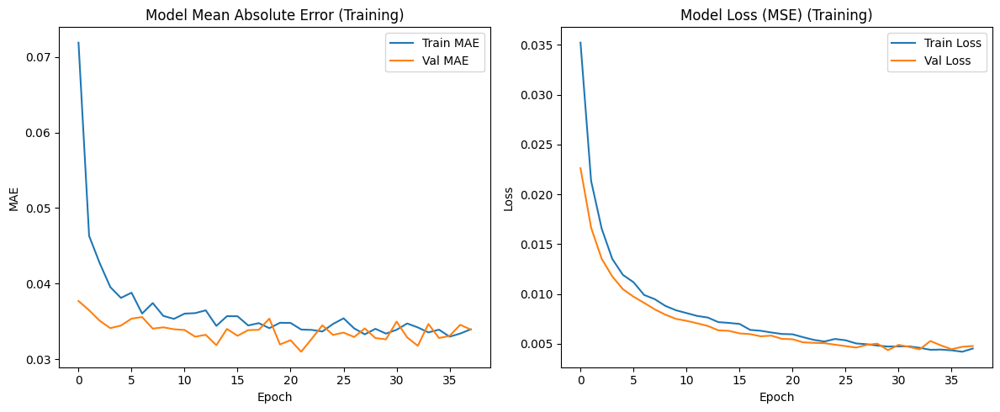

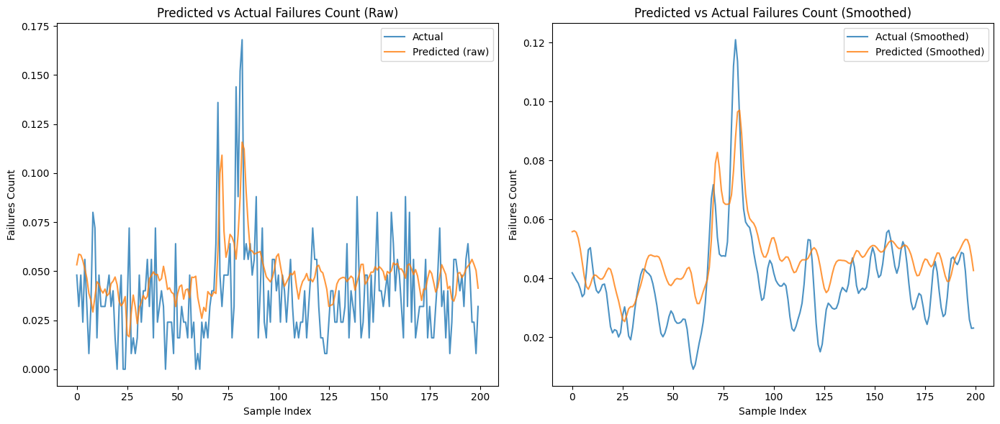

In [100]:
import matplotlib.pyplot as plt

# === 1️⃣ Training history ===
plt.figure(figsize=(12, 5))

# Plot MAE (raw during training)
plt.subplot(1, 2, 1)
plt.plot(history.history['mae'], label='Train MAE')
plt.plot(history.history['val_mae'], label='Val MAE')
plt.title('Model Mean Absolute Error (Training)')
plt.xlabel('Epoch')
plt.ylabel('MAE')
plt.legend()

# Plot Loss (MSE during training)
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Model Loss (MSE) (Training)')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# === 2️⃣ Predictions vs Actuals (sequence data for failures_count) ===
plt.figure(figsize=(14, 6))

# Plot raw predictions vs actual (first 200 points for clarity)
plt.subplot(1, 2, 1)
plt.plot(y_test_seq[:200], label='Actual', alpha=0.8)
plt.plot(y_pred[:200], label='Predicted (raw)', alpha=0.8)
plt.title('Predicted vs Actual Failures Count (Raw)')
plt.xlabel('Sample Index')
plt.ylabel('Failures Count')
plt.legend()

# Plot smoothed predictions vs actual
plt.subplot(1, 2, 2)
plt.plot(y_test_smoothed[:200], label='Actual (Smoothed)', alpha=0.8)
plt.plot(y_pred_smoothed[:200], label='Predicted (Smoothed)', alpha=0.8)
plt.title('Predicted vs Actual Failures Count (Smoothed)')
plt.xlabel('Sample Index')
plt.ylabel('Failures Count')
plt.legend()

plt.tight_layout()
plt.show()

In [101]:
# =========================
# 9️⃣ Predict + inverse scale
# =========================
from scipy.ndimage import gaussian_filter1d

y_pred = model.predict(X_test_seq).flatten()
y_pred_inv = scaler_y.inverse_transform(y_pred.reshape(-1,1)).flatten()
y_test_inv = scaler_y.inverse_transform(y_test_seq.reshape(-1,1)).flatten()

# Smooth for plotting
y_pred_smooth = gaussian_filter1d(y_pred_inv, sigma=1.5)
y_test_smooth = gaussian_filter1d(y_test_inv, sigma=1.5)

df_forecast = pd.DataFrame({
    'Day': daily_test['day'].iloc[window_size-1:window_size-1+len(y_test_seq)],
    'Actual_Failures': y_test_inv,
    'Predicted_Failures': y_pred_inv,
    'Actual_Failures_Smoothed': y_test_smooth,
    'Predicted_Failures_Smoothed': y_pred_smooth
})

print(df_forecast.head())

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
         Day  Actual_Failures  Predicted_Failures  Actual_Failures_Smoothed  \
2 2023-12-20              6.0            6.657451                  5.230552   
3 2023-12-21              4.0            7.336699                  5.080544   
4 2023-12-22              6.0            7.279584                  4.917366   
5 2023-12-23              3.0            6.921331                  4.784868   
6 2023-12-24              7.0            6.389410                  4.543382   

   Predicted_Failures_Smoothed  
2                     6.974856  
3                     7.010561  
4                     6.952600  
5                     6.697009  
6                     6.243854  


In [102]:
import numpy as np
import pandas as pd
from scipy.ndimage import gaussian_filter1d

# --- Parameters ---
FUTURE_STEPS = 3
window_size = X_test_seq.shape[1]  # must match training window
last_known_day = daily_data['day'].max()  # last day in your dataset

# --- Prepare last input sequence from test data ---
X_last_window = np.expand_dims(X_test_seq[-1], axis=0)  # shape: (1, window_size, feature_dim)

future_scores = []
future_days = []

for step in range(1, FUTURE_STEPS + 1):
    # Predict scaled value
    pred_scaled = model.predict(X_last_window, verbose=0).flatten()[0]
    # Inverse scale to original range
    pred_score = scaler_y.inverse_transform([[pred_scaled]])[0, 0]
    future_scores.append(pred_score)

    # Next day
    next_day = last_known_day + pd.Timedelta(days=step)
    future_days.append(next_day)

    # --- Update rolling window with predicted value ---
    new_window = X_last_window[0, 1:, :].copy()  # drop first day from window
    new_step = X_last_window[0, -1, :].copy()   # copy last day features

    # Replace target feature with predicted scaled value
    # Assuming the first column of X is the target-related feature
    new_step[0] = pred_scaled

    # Append predicted step to window
    new_window = np.vstack([new_window, new_step])
    X_last_window = np.expand_dims(new_window, axis=0)

# --- Build forecast DataFrame ---
df_future = pd.DataFrame({
    'Day': future_days,
    'Predicted_Failures_Smoothed': gaussian_filter1d(future_scores, sigma=1)
})

# --- Add placeholders for hover features ---
hover_features = [
    'score', 'total_count',
    'score_lag1', 'score_ratio',
    'score_roll_mean', 'score_roll_std',
    'score_delta'
]

df_future['Review_Summary'] = 'No reviews yet'
for f in hover_features:
    df_future[f] = np.nan

print("Future Forecast for Next 3 Days:")
print(df_future[['Day', 'Predicted_Failures_Smoothed']])


Future Forecast for Next 3 Days:
         Day  Predicted_Failures_Smoothed
0 2025-01-01                     4.593876
1 2025-01-02                     4.568103
2 2025-01-03                     4.596184


In [103]:
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# =========================
# Hover Features (without reviews)
# =========================
hover_features = [
    'score', 'total_count',
    'score_lag1', 'score_ratio',
    'score_roll_mean', 'score_roll_std',
    'score_delta'
]

# =========================
# Merge Forecast + Features
# =========================
df_hover = (
    df_forecast.merge(
        daily_data[['day'] + hover_features],
        left_on='Day', right_on='day', how='left'
    )
)

df_hover = df_hover[['Day', 'Actual_Failures_Smoothed', 'Predicted_Failures_Smoothed'] + hover_features]

# =========================
# Future Forecast Placeholders
# =========================
for f in hover_features:
    df_future[f] = np.nan

# =========================
# Risk Threshold
# =========================
threshold = 10
df_hover['High_Risk'] = df_hover['Predicted_Failures_Smoothed'] > threshold
df_future['High_Risk'] = df_future['Predicted_Failures_Smoothed'] > threshold

# =========================
# Customdata for Hover (no reviews)
# =========================
def get_customdata(df_set):
    return np.stack([
        df_set.get('score', pd.Series(0)).fillna(0),
        df_set.get('score_lag1', pd.Series(0)).fillna(0),
        df_set.get('score_ratio', pd.Series(0)).fillna(0),
        df_set.get('score_roll_mean', pd.Series(0)).fillna(0),
        df_set.get('score_roll_std', pd.Series(0)).fillna(0),
        df_set.get('score_delta', pd.Series(0)).fillna(0),
        df_set.get('total_count', pd.Series(0)).fillna(0)
    ], axis=-1)

customdata_hover = get_customdata(pd.concat([df_hover, df_future], ignore_index=True))

# =========================
# Plotly Interactive Graph
# =========================
fig = go.Figure()

# --- Actual Failures ---
fig.add_trace(go.Scatter(
    x=df_hover['Day'],
    y=df_hover['Actual_Failures_Smoothed'],
    mode='lines+markers',
    name='Actual Failures',
    line=dict(color='blue', width=2),
    hovertemplate=(
        'Date: %{x}<br>Actual: %{y:.2f}<br>'
        'Score: %{customdata[0]:.2f}<br>'
        'Lag1: %{customdata[1]:.2f}<br>'
        'Ratio: %{customdata[2]:.2f}<br>'
        'Roll Mean: %{customdata[3]:.2f}<br>'
        'Roll Std: %{customdata[4]:.2f}<br>'
        'Delta: %{customdata[5]:.2f}<br>'
        'Total Count: %{customdata[6]:.0f}<extra></extra>'
    ),
    customdata=customdata_hover[:len(df_hover)]
))

# --- Predicted Failures (Historical) ---
fig.add_trace(go.Scatter(
    x=df_hover['Day'],
    y=df_hover['Predicted_Failures_Smoothed'],
    mode='lines+markers',
    name='Predicted Failures',
    line=dict(color='red', width=2),
    hovertemplate=(
        'Date: %{x}<br>Predicted: %{y:.2f}<br>'
        'Score: %{customdata[0]:.2f}<br>'
        'Lag1: %{customdata[1]:.2f}<br>'
        'Ratio: %{customdata[2]:.2f}<br>'
        'Roll Mean: %{customdata[3]:.2f}<br>'
        'Roll Std: %{customdata[4]:.2f}<br>'
        'Delta: %{customdata[5]:.2f}<br>'
        'Total Count: %{customdata[6]:.0f}<extra></extra>'
    ),
    customdata=customdata_hover[:len(df_hover)]
))

# --- Predicted Failures (Future Forecast) ---
fig.add_trace(go.Scatter(
    x=df_future['Day'],
    y=df_future['Predicted_Failures_Smoothed'],
    mode='lines+markers',
    name='Future Forecast',
    line=dict(color='orange', width=2, dash='dash'),
    hovertemplate=(
        'Date: %{x}<br>Forecast: %{y:.2f}<br>'
        'Score: %{customdata[0]:.2f}<br>'
        'Lag1: %{customdata[1]:.2f}<br>'
        'Ratio: %{customdata[2]:.2f}<br>'
        'Roll Mean: %{customdata[3]:.2f}<br>'
        'Roll Std: %{customdata[4]:.2f}<br>'
        'Delta: %{customdata[5]:.2f}<br>'
        'Total Count: %{customdata[6]:.0f}<extra></extra>'
    ),
    customdata=customdata_hover[len(df_hover):]
))

# --- Risk Zones ---
for df_set in [df_hover, df_future]:
    for i in range(len(df_set)):
        if df_set['High_Risk'].iloc[i]:
            fig.add_vrect(
                x0=df_set['Day'].iloc[i],
                x1=df_set['Day'].iloc[i] + pd.Timedelta(days=1),
                fillcolor="red",
                opacity=0.2,
                layer="below",
                line_width=0
            )

# --- Threshold Line ---
fig.add_hline(
    y=threshold,
    line=dict(color="orange", width=2, dash="dash"),
    annotation_text=f"Risk Threshold ({threshold})",
    annotation_position="bottom right"
)

# --- Layout ---
fig.update_layout(
    title='Time Series: Actual, Predicted, and Future Forecast with Risk Zones',
    xaxis_title='Date',
    yaxis_title='Failures Count',
    hovermode='x unified',
    template='plotly_white'
)

fig.show()